In [114]:
using Pkg
Pkg.activate("/home/users/shubhgup/Codes/Julia/TISExperiments.jl")

  Activating environment at `~/Codes/Julia/TISExperiments.jl/Project.toml`


In [2]:
using Revise

In [40]:
using POMDPs, POMDPGym, POMDPSimulators, POMDPPolicies, Distributions
using BSON
using SARSOP, Random
using POMCPOW
using BeliefUpdaters
using ParticleFilters
using FileIO
using TISExperiments
using POMDPGifs
using D3Trees
# using Interact
using TreeImportanceSampling
include("pendulum_topple.jl")

save_trajectories (generic function with 1 method)

In [41]:
# using WebIO
# WebIO.install_jupyter_nbextension()
# using Conda
# Conda.pip_interop(true)
# Conda.pip("install", "webio_jupyter_extension")

In [42]:
using Plots
using ProgressMeter

In [43]:
Random.seed!(42)
Px, amdp = gen_topple_mdp(px=Normal(0, 0.4), Nsteps=20, dt=0.1, failure_thresh=π/4)

[0.016076277914104813, 0.300976522676192, 0.3658943988194062, 0.300976522676192, 0.016076277914104813]


(DiscreteNonParametric{Float32, Float64, Vector{Float32}, Vector{Float64}}(
support: Float32[-1.0, -0.25, 0.0, 0.25, 1.0]
p: [0.016076277914104813, 0.300976522676192, 0.3658943988194062, 0.300976522676192, 0.016076277914104813]
)
, RMDP{Array{Float32, N} where N, Array{Float32, N} where N}
  amdp: PendulumMDP
  π: FunPolicy
  cost_fn: costfn (function of type var"#costfn#21")
  include_time_in_state: Bool true
  dt: Float64 0.1
  maxT: Float64 1.9000000000000001
  disturbance_type: Symbol arg
)

In [44]:
dt = 0.1; # Do not change
maxT = 2.0; # Do not change

In [45]:
function POMDPGym.disturbances(m::PendulumMDP)
    return Px
end

In [46]:
fixed_s = rand(initialstate(amdp));

In [47]:
actions(amdp, fixed_s)

DiscreteNonParametric{Float32, Float64, Vector{Float32}, Vector{Float64}}(
support: Float32[-1.0, -0.25, 0.0, 0.25, 1.0]
p: [0.016076277914104813, 0.300976522676192, 0.3658943988194062, 0.300976522676192, 0.016076277914104813]
)


In [115]:
N = 10_000
c = 0.0
α = 1e-3

β = 0.01
γ = 0.01

schedule = 1.0 # set to Inf to switch off

uniform_floor = 1e-6 # set to 0.0 to switch off

baseline = false
base_continue = false

path = "data/pendulum_topple";

if base_continue
    baseline_costs = load("$(path)_baseline_$(N).jld2")["risks"]
else
    baseline_costs = []
end


Any[]

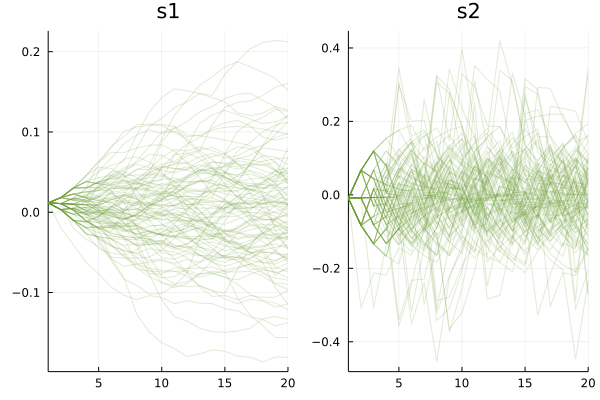

In [112]:
function plot_path(history; plots = [], idx=1)
    state_l = hcat([step.s[2:end] for step in history]...)
    costs_l = [step.r for step in history]
    labels = ["s1", "s2"]
    if length(plots)==0
        for label in labels
            p = plot(xlim = (1, length(history)), title = label, legend=false)
            push!(plots, p)
        end
    end
    for i=1:length(labels)
        plot!(plots[i], state_l[i, :], color=idx, alpha=0.2)
    end
#     p = plot(xlim = (1, length(history)))
#     plot!(costs_l, label="r")
#     push!(plots, p)
    
    return plots
end
plots = []

for i=1:100
    history = simulate(HistoryRecorder(), amdp, FunctionPolicy((s) -> rand(disturbances(amdp))), fixed_s);
    # history = simulate(HistoryRecorder(), amdp, FunctionPolicy((s) -> [0.0, 0.0, 0.0]), fixed_s);
    plots = plot_path(history; plots=plots, idx=0)
end
plot(plots...)

In [100]:
@showprogress for i=1:N
    cost = sum(collect(simulate(HistoryRecorder(), amdp, FunctionPolicy((s) -> rand(disturbances(amdp))), fixed_s)[:r]))
#     cost = sum(collect(simulate(HistoryRecorder(), amdp, FunctionPolicy((s) -> [0.0, 0.0, 0.0]), fixed_s)[:r]))
    push!(baseline_costs, cost)
end
# baseline_costs_1 = baseline_costs

Progress: 100%|█████████████████████████████████████████| Time: 0:00:01


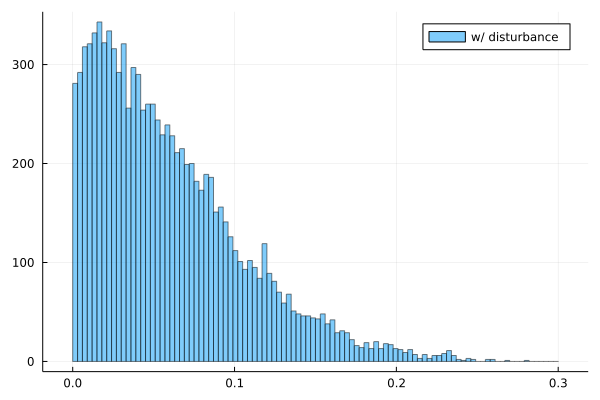

In [101]:
# p = histogram(plot_costs[1][2], label="$(plot_costs[1][1])", alpha=0.4, bins=100)
# for x in plot_costs[end:end]
#     histogram!(x[2], label="$(x[1])", alpha=0.4, bins=100)
# end
# p
histogram(baseline_costs, alpha=0.5, label="w/ disturbance", bins=0:0.003:0.3)
# histogram!(baseline_costs_1, alpha=0.5, label="w/o disturbance", bins=1:6:600)

In [87]:
# Similarity metric for comparing a realized state to the stored tree states
function is_similar(state_a, state_b)
    return (state_a == state_b)
end

is_similar (generic function with 1 method)

In [116]:
# print("Starting grid search...")
# mc_samps = load("data/gridworld_baseline_10000000.jld2")["risks"]
# mc_samps = [Float64(samp) for samp in mc_samps]

# TISExperiments.run_grid_search(amdp, fixed_s, disturbance, mc_samps, ones(length(mc_samps)), path)
# TISExperiments.run_grid_search(amdp, tree_mdp, fixed_s, disturbance, mc_samps, ones(length(mc_samps)), path; N_l=[1_000_000], save_every=1)
# TISExperiments.run_grid_search(amdp, tree_mdp, fixed_s, disturbance, mc_samps, ones(length(mc_samps)), path; N_l=[10_000], α_l=[1e-2], β_a_l=[0.5], β_b_l=[0.3], schedule_l = [0.1])

# print("...Completed.")


# results_baseline, results_tis, planner = TISExperiments.run_baseline_and_treeIS(amdp, fixed_s, disturbance; N, c, α, β, γ, schedule, uniform_floor, baseline)

tree_mdp = construct_tree_amdp(amdp, disturbance; reduction="sum")
planner = TreeImportanceSampling.mcts_isdpw(tree_mdp; N=N, c, α)
tree_fixed_s = TreeImportanceSampling.TreeState(fixed_s);
traj_plots = [];

In [117]:
a, info = TreeImportanceSampling.action_info(planner, tree_fixed_s; tree_in_info=true, N=100, c, α, β, γ, schedule, uniform_floor, baseline)
tis_output = (planner.mdp.costs, [], planner.mdp.IS_weights, info[:tree]);

"$(strategy_text) strategy" = "VaR strategy"


Progress: 100%|█████████████████████████████████████████| Time: 0:00:21


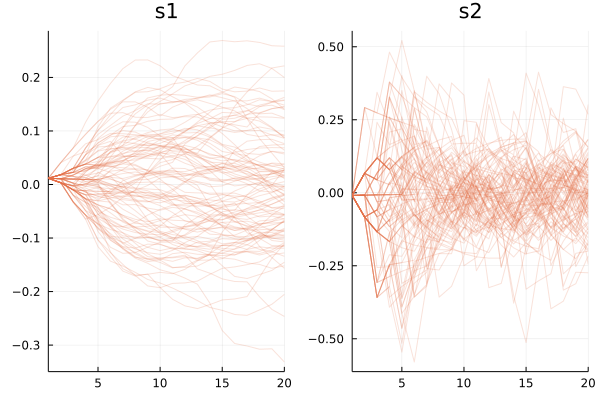

In [118]:
lookup = TreeImportanceSampling.mdp_state_lookup(planner)
plots = []
for i=1:100
    history = simulate(HistoryRecorder(), amdp, FunctionPolicy((s) -> TreeImportanceSampling.tree_policy(planner, s, lookup; schedule=schedule)), fixed_s);
    plots = plot_path(history; plots=plots, idx=2)
end
plot(plots...)
# planner.tree.cdf_est
# planner.tree.total_n
# planner.mdp.costs

In [119]:
D3Tree(planner.tree.dpw_tree)

Float32[0.0, 0.011583058, -0.009194173]
N:  10000

├──                     -1.0
│  Q:   0.07
│  N:    349

│  └──[0.1, -0.019225984811782837, -0.3080904185771942]
│     N:    348

│     ├──                     -1.0
│     │  Q:   0.10
│     │  N:      7
 (1 children)
│     ├──                    -0.25
│     │  Q:   0.08
│     │  N:    100
 (1 children)
│     ├──                      0.0
│     │  Q:   0.07
│     │  N:    151
 (1 children)
│     ├──                     0.25
│     │  Q:   0.07
│     │  N:     82
 (1 children)
│     └──                      1.0
│        Q:   0.05
│        N:      8
 (1 children)
├──                    -0.25
│  Q:   0.06
│  N:   2651

│  └──[0.1, 0.0032740160822868347, -0.08309042453765869]
│     N:   2650

│     ├──                     -1.0
│     │  Q:   0.07
│     │  N:     78
 (1 children)
│     ├──                    -0.25
│     │  Q:   0.06
│     │  N:    809
 (1 children)
│     ├──                      0.0
│     │  Q:   0.06
│     │  N:   1244
 (1 children)
│     ├──                     0.25
│     │  Q:   0.06
│     │  N:    442
 (1 children)
│     └──                      1.0
│        Q:   0.07
│        N:     77
 (1 children)
├──                      0.0
│  Q:   0.07
│  N:   3419

│  └──[0.1, 0.010774016380310059, -0.008090421557426453]
│     N:   3418

│     ├──                     -1.0
│     │  Q:   0.07
│     │  N:    105
 (1 children)
│     ├──                    -0.25
│     │  Q:   0.07
│     │  N:    663
 (1 children)
│     ├──                      0.0
│     │  Q:   0.06
│     │  N:   1387
 (1 children)
│     ├──                     0.25
│     │  Q:   0.06
│     │  N:   1128
 (1 children)
│     └──                      1.0
│        Q:   0.08
│        N:    135
 (1 children)
├──                     0.25
│  Q:   0.07
│  N:   3256

│  └──[0.1, 0.018274016678333282, 0.06690958142280579]
│     N:   3255

│     ├──                     -1.0
│     │  Q:   0.07
│     │  N:     87
 (1 children)
│     ├──                    -0.25
│     │  Q:   0.06
│     │  N:    596
 (1 children)
│     ├──                      0.0
│     │  Q:   0.07
│     │  N:   1289
 (1 children)
│     ├──                     0.25
│     │  Q:   0.07
│     │  N:   1150
 (1 children)
│     └──                      1.0
│        Q:   0.08
│        N:    133
 (1 children)
└──                      1.0
   Q:   0.07
   N:    325

   └──[0.1, 0.040774017572402954, 0.2919095754623413]
      N:    324

      ├──                     -1.0
      │  Q:   0.07
      │  N:     19
 (1 children)
      ├──                    -0.25
      │  Q:   0.07
      │  N:     83
 (1 children)
      ├──                      0.0
      │  Q:   0.08
      │  N:    109
 (1 children)
      ├──                     0.25
      │  Q:   0.08
      │  N:    105
 (1 children)
      └──                      1.0
         Q:   0.09
         N:      8
 (1 children)

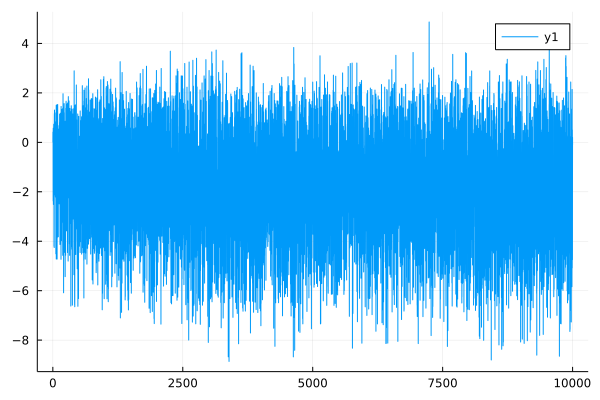

In [96]:
plot(planner.mdp.IS_weights)

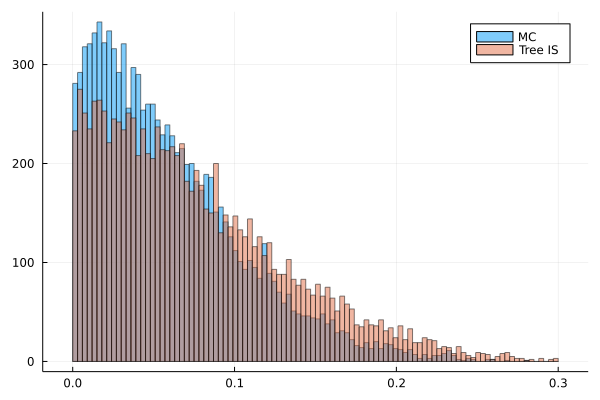

In [102]:
tis_range = (1, length(tis_output[1]))
histogram(baseline_costs[tis_range[1]:tis_range[2]], alpha=0.5, label="MC", bins=0:0.003:0.3)
histogram!(planner.mdp.costs[tis_range[1]:tis_range[2]], alpha=0.5, label="Tree IS", bins=0:0.003:0.3)

In [ ]:

# print("Baseline metrics")

# TISExperiments.evaluate_metrics(baseline_costs; alpha_list=[1e-3])

# print("\nTIS metrics: N=$(N), c=$(c), α=$(α), β=$(β)), γ=$(γ)")

# TISExperiments.evaluate_metrics(tis_output[1][tis_range[1]:tis_range[2]]; weights=exp.(tis_output[3][tis_range[1]:tis_range[2]]), alpha_list=[1e-3])

# if baseline
# save("$(path)_baseline_$(N).jld2", Dict("risks" => baseline_costs, "states" => []))
# # else
# #     save("$(path)_mcts_IS_$(N).jld2", Dict("risks" => results_tis[1], "states" => results_tis[2], "IS_weights" => results_tis[3], "tree" => results_tis[4]))
# # end

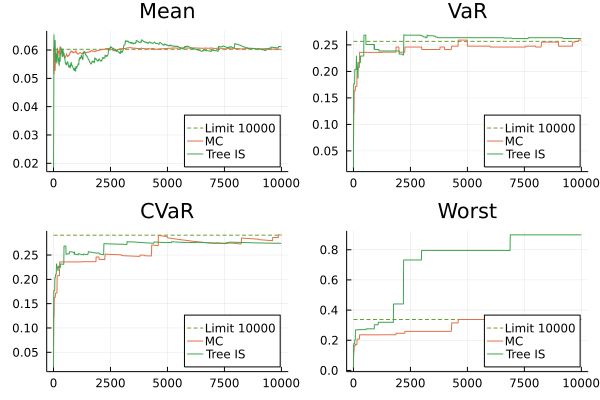

In [104]:
TISExperiments.plot_metrics([baseline_costs, baseline_costs, tis_output[1]]; weights_l=[nothing, nothing, exp.(tis_output[3])], range_l = tis_range, alpha=1e-3, names=["Limit", "MC", "Tree IS"], N_list = [2^i for i=1:10])